In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'confused-eeg:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F106%2F24522%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240915%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240915T103511Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D27045b8c49f7c5561b3b355ac7683bbbc3c9ef98639ffec5cc0b45b3f516f5348aa2e84dad7f1d47789bdf4966c1b5be03c86845c34245d6cbb9bee1368a8c59cbb5b6ce3fc968002f1c1391ec4614b73e689904f03b2215489ba9ee2a2b299e0d4f4157f35fc2de400efb0ba983c1fb5ca83b3e3267fd88683385f10a6debf5da1fe6d10e64c2e88cc3e346304a43ab170dec54605d048e1267d35ffab36797910472fc06e7b2662f2fcb27fedae8165798e040e979c9dc96a3839d0cb52ffab5cc0ab662c700aece26ab073f03e2c6a2f0fa0698b92c4573139e0f57dff238865e21548ec3698285c51758063a8e14a4cbb8030eddb0d256ff9d4d5ccc05f5,eeg-brainwave-dataset-feeling-emotions:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F93959%2F218459%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240915%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240915T103511Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D32994d4230af30f4a221fc09031a57133ac9ffcba11af2366609795e1925551d4f3af312f5fa21c1fd9fb5aebe01b39042a324292fa977e4d3c3b6ce1b8cb2dd5b16bd3a6138cfa27ead12dcc7f9972e8cbc869e439c8e085c6c0299ee2fd132b63b90b5aee24f31903351fea12ae34ab2ba27441367f5dcd9ba6f9104014be69cb2cbd162c181b920cbdc32c89f9bdbec7bd24f3c83b9c9a05829f998a8b2a4fe9e05b8b73dc75f6cf22fcd1be115658dbfdc3c659364dfb44434bf77af4e97137c191b4565adc944b37571090aaa0d80030169b015c67cc71bba8b8402ed5a4c0b5738c4f6aace0d66e6f6d2fb44bff6e7bd88abe054dc356cf5b890584130,eeg-data-for-mental-attention-state-detection:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F159484%2F365400%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240915%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240915T103511Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D4737a2c56b73344d42c4bdec9dde7ab4aa4894559c3fe6b839528fe4d41ccc7d39c958524f525168766aee8d4f96ac5a077219d2207752be458e737c8e5e4458dfe4f59117c3e92a87167e0295e5c1f8e26d5f912b5d402cae3d7597177a7c11bbae9b073f4dcdd0883b97a8e48d01f3adcf365527be8f732eed874ef8f602af346c7c7dfd0c78387d02f5dab6fc9619e6530653cea631349c549e542b8281173aeff18bcb1dfe0fdd0363938599bf15616ec7a287bd67c42a44505ddb0c7be5fffa17a5f9fbbf6e219266120ee614892e822daaadd02daadd43d5f58eea042306f32503a1a820ece8d4998b54564259be81f810307d8f5cc7be6c455e4d95f4,rem-and-nrem-sleep-classification:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3520887%2F6140055%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240915%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240915T103511Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D01e3453d1baeaaad19ad1015f701b344c1bcd1b155836d9080032d34bb3a3bf31afe58a7b301bc9c998d360880cbfe86c90755c3383ed23888541e5d7f117df6a08235c1418462fd0fc60203f0c120ed184838836087017b8733a8f4a74e2c72a870f4f96ac3c601e8575ebff7ccefdcfa8cf6216610ae30786beb14e11db9234b392066943db8653eecf5871704e87ceba7258ccdebe5a46b0b50bb0ddda58b48295d76bdb7de3744e49126b5587ca597dd2ca706b3c7e5b6f35cf3de2a24231f45db889b10ae968d990cd763231f5cca17ae8c26f5cfe31ba5a55ca4505d69572e7c223c6cfafe42fcac2b837a07ea8d987f2b9b268c253805d9153e22342c,sleepy-driver-eeg-brainwave-data:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3684204%2F6391469%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240915%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240915T103511Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D0c03b8a4cbd409c7dcfc383adcaa9d4ee502192aae58b13dc9af018616c0162112d2a5be3e8853aafe943f7b84f6cab1c633ada5bb598ec47eadf00803dacdbd5ba5ee09c732c681c508ca8095636196ae4084af0f2eb0cc196defe8afac2becb3ac39149684a150c11b7b7e99a9aaf5c746c873b836ad0cd1e546c76e97cb6045dd4661206a53786f8661566ef613adcd970dc0b23fe5d7fbf43dd3ca2575a33bbfce261a454424c76f0b607331dd8da5acfe57551f36317209dd8ac6a8a1fdf93b02fdc77d4e8534bcea6ee2b08fe1f1f5ca781e1639e3ca2dc12103f3ce741a6149086f3f2811b24df3da4dca02015912cd8045bec0d4e192519cd32b3f82'

KAGGLE_INPUT_PATH='kaggle/input'
KAGGLE_WORKING_PATH='kaggle/working'
KAGGLE_SYMLINK='kaggle'

os.makedirs(KAGGLE_SYMLINK)
os.makedirs(KAGGLE_INPUT_PATH, 0o777)
os.makedirs(KAGGLE_WORKING_PATH, 0o777)

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 114134669 bytes downloaded
Downloaded and uncompressed: confused-eeg
[==================================================] 12498935 bytes downloaded
Downloaded and uncompressed: eeg-brainwave-dataset-feeling-emotions
[================================================= ] 579624960 bytes downloaded
Downloaded and uncompressed: eeg-data-for-mental-attention-state-detection
[==================================================] 11654069 bytes downloaded
Downloaded and uncompressed: rem-and-nrem-sleep-classification
[==================================================] 93280 bytes downloaded
Downloaded and uncompressed: sleepy-driver-eeg-brainwave-data
Data source import complete.


# OPTIME

Our brain is the fastest and most incredible processor in existence. With our machine learning algorithms we look to tap into the unconsious of 
our mind to help us live a better life. Using wearable EEG (electroenecephalogram) devices like the one pictured below we are able to read the brain waves that our mind produces. We are able to use this information to detect information like our moods, sleep cycles, focus, and even uses in medical cases like detecting seizures. 

With our machine learning algorithms that we have dubbed OPTIME, we look to optmize our daily lives and routines and track our performance. We will be able to read the data and determine optimal tasks to undertake. Let's say for instance you are sitting on the couch and have high magnitude of gamma waves coming into your head, our software will suggest that you get up and do some high energy or challenging tasks in order to take advantage of your current state.

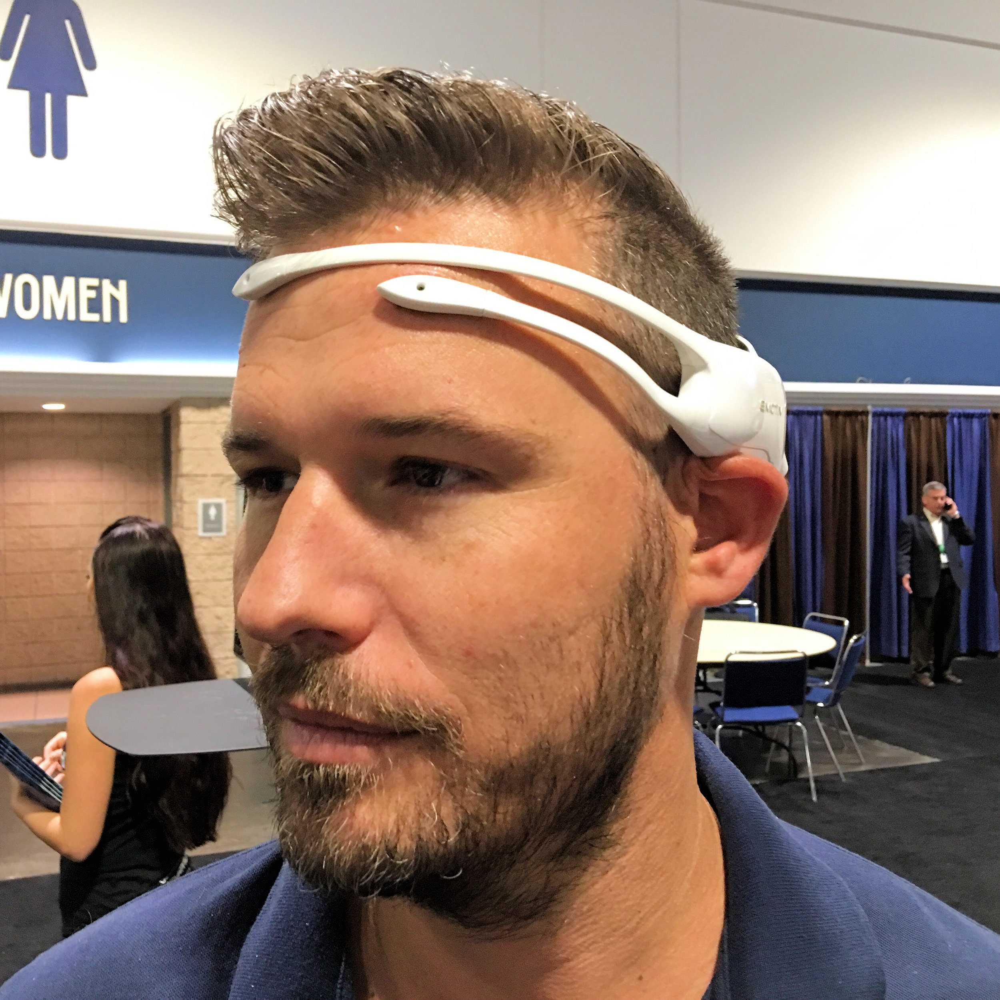

In [ ]:
import scipy.io
import numpy as np
import pickle
import os
import pandas as pd
from scipy import signal
from scipy.signal import butter, lfilter, freqz
import matplotlib.pyplot as plt
from scipy.fft import fft, fftshift
from scipy.signal import welch

# Loading Data and formatting datasets

In [15]:
print(os.getcwd())


/home/jupyter/imported


In [ ]:
imported/kaggle/input/eeg-data-for-mental-attention-state-detection/eeg data/EEG Data/eeg_record1.mat

file_names = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        file_path = os.path.join(dirname,filename)
        if file_path not in files_to_exclude:
            file_names.append(file_path)
        #print(file_path)
        
print(file_names)

In [18]:
files_to_exclude = [
    '/home/jupyter/imported/kaggle/input/eeg-brainwave-dataset-feeling-emotions/emotions.csv',
    '/home/jupyter/imported/kaggle/input/sleepy-driver-eeg-brainwave-data/acquiredDataset.csv',
    '/home/jupyter/imported/kaggle/input/confused-eeg/EEG_data.csv',
    '/home/jupyter/imported/kaggle/input/confused-eeg/demographic_info.csv',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/7.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/1.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/6.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/8.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/3.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/5.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/0.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/4.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/2.m4v',
    '/home/jupyter/imported/kaggle/input/confused-eeg/videos/9.m4v',
    '/home/jupyter/imported/kaggle/input/rem-and-nrem-sleep-classification/REM_NREM.csv',
    '/home/jupyter/imported/optime-notebook-a68c83d2-c00c-4f87-8eaf-af8322ed0395.ipynb',
    '/home/jupyter/imported/kaggle/input/confused-eeg/.ipynb_checkpoints/EEG_data-checkpoint.csv',
    '/home/jupyter/imported/.ipynb_checkpoints/optime-notebook-a68c83d2-c00c-4f87-8eaf-af8322ed0395-checkpoint.ipynb'
    
]
file_names = []
for dirname, _, filenames in os.walk('/home/jupyter/imported'):
    for filename in filenames:
        file_path = os.path.join(dirname,filename)
        if file_path not in files_to_exclude:
            file_names.append(file_path)
        #print(file_path)
        
print(file_names)

['/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record6.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record17.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record4.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record15.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record9.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record21.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record32.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record2.mat', '/home/jupyter/imported/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record11.mat', '/ho

In [12]:
emotion_data = pd.read_csv('/home/jupyter/imported/kaggle/input/eeg-brainwave-dataset-feeling-emotions/emotions.csv')
confused_data = pd.read_csv('/home/jupyter/imported/kaggle/input/confused-eeg/EEG_data.csv')
sleepy_data = pd.read_csv('/home/jupyter/imported/kaggle/input/sleepy-driver-eeg-brainwave-data/acquiredDataset.csv')

In [19]:
mat = scipy.io.loadmat(file_names[0])
data = mat['o']['data'][0,0]
fs = mat['o']['sampFreq'][0][0][0][0]

channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', '02', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
channels_used = ['F7', 'F3', 'P7','O1','O2','P8','AF4']
useful_channels = [4,5,8,9,10,11,16]
marker = 128*60*10

useful_file_index = [3,4,5,6,7,10,11,12,13,14,17,18,19,20,21,24,25,26,27,31,32,33,34]

trial_names=[]
data_focus = {}
data_unfocus = {}
data_drowsy = {}

In [20]:
for file_path in file_names:
    base_name = os.path.basename(file_path)
    #print(base_name)
    if base_name.startswith('eeg_record'):
        file_id = int(base_name.split('eeg_record')[1].split('.')[0])
        if file_id in useful_file_index:
            mat = scipy.io.loadmat(file_path)
            trial_name = base_name.split('.')[0]
            trial_names.append(trial_name)
            data_focus[trial_name] = {}
            data_unfocus[trial_name] = {}
            data_drowsy[trial_name] = {}
#         except(IndexError, ValueError) as e:
#             continue
            for i, ch_index in enumerate(useful_channels):
                channel_name = channels_used[i]
            
                data_focus[trial_name][channel_name] = mat['o']['data'][0,0][0:marker, ch_index].copy()
                data_unfocus[trial_name][channel_name] = mat['o']['data'][0,0][marker:2*marker, ch_index].copy()
                data_drowsy[trial_name][channel_name] = mat['o']['data'][0,0][2*marker:3*marker, ch_index].copy()
            
def create_dataframe(data_dict, label):
    data_frames = []
    for trial_name, channels in data_dict.items():
        # Initialize a DataFrame for each trial with all channels
        trial_df = pd.DataFrame()
        for channel_name, data in channels.items():
            trial_df[channel_name] = data
        # Add columns for Trial and Label
        trial_df['Trial'] = trial_name
        trial_df['Label'] = label
        data_frames.append(trial_df)
    return pd.concat(data_frames, ignore_index=True)

# Create dataframes for each condition
df_focus = create_dataframe(data_focus, 'focus')
df_unfocus = create_dataframe(data_unfocus, 'unfocus')
df_drowsy = create_dataframe(data_drowsy, 'drowsy')

# Concatenate all conditions into a final dataframe
final_df = pd.concat([df_focus, df_unfocus, df_drowsy], ignore_index=True)

print(final_df.head())

            F7           F3           P7           O1           O2  \
0  3992.307692  5018.974359  4315.897436  4384.615385  4033.846154   
1  3991.794872  5017.948718  4320.000000  4384.102564  4032.820513   
2  3992.820513  5014.871795  4319.487179  4386.666667  4035.384615   
3  3990.769231  5011.282051  4315.384615  4384.615385  4029.230769   
4  3989.230769  5015.384615  4315.384615  4379.487179  4020.000000   

            P8          AF4        Trial  Label  
0  4161.538462  4081.538462  eeg_record6  focus  
1  4157.948718  4083.076923  eeg_record6  focus  
2  4151.794872  4078.974359  eeg_record6  focus  
3  4150.769231  4073.333333  eeg_record6  focus  
4  4152.820513  4076.923077  eeg_record6  focus  


# Data Cleaning

Although our datasets came from research driven expirements the data was collected and processed in different ways. As we see in the case above the data was taken a raw eeg data from the electrodes without any preprocessing. In order to process the data we will look aply welch's power spectral density transformation to each dataset to convert the raw eeg data into frequency band amplitudes so we are able to see the band waves. On top of this we will standardize the formatting of the data so they are congruent and can be used for our task classification algorithm. 

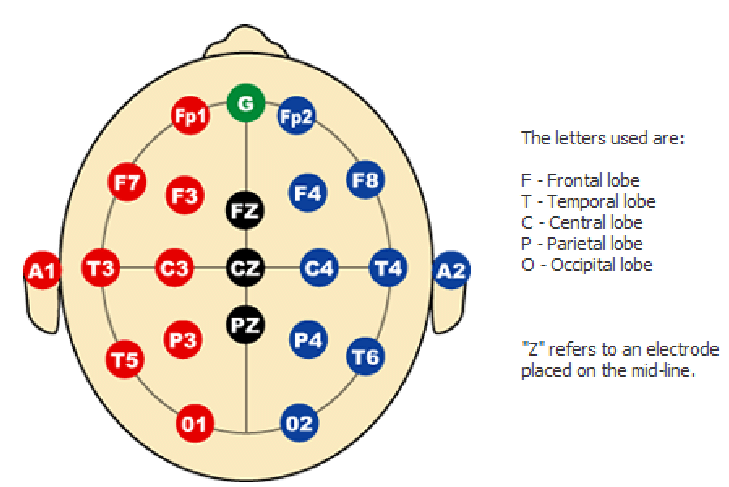

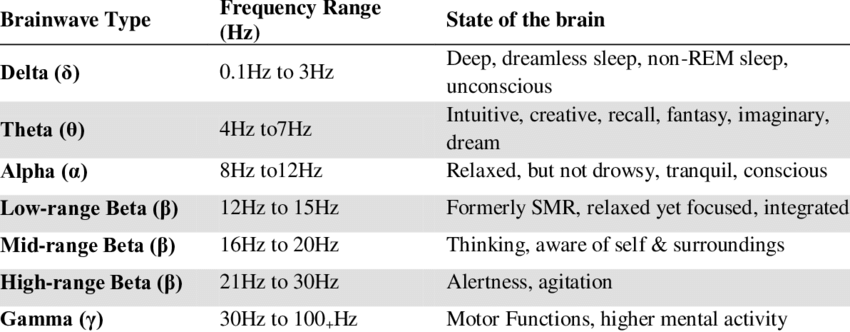

In [21]:
import numpy as np
from scipy.signal import welch

def compute_band_powers(final_df, fs):
    if final_df.ndim != 1:
        raise ValueError("Data must be a 1D array")
    
    # Compute power spectral density using Welch's method
    freqs, psd = welch(final_df, fs, nperseg=fs*2)

In [22]:
frequency_bands = {
    'Delta': (0.5,4),
    'Theta': (4,8),
    'Alpha1': (8.5,10),
    'Alpha2':(10.5,12),
    'Beta1': (13,20),
    'Beta2': (20.5,30),
    'Gamma1': (30.5,40),
    'Gamma2':(40.5,50)
}

def compute_band_powers(df_focus, fs):
    freqs, psd = welch(df_focus, fs, nperseg=fs*2)
    
    band_powers = {}
    for band, (low,high) in frequency_bands.items():
        band_freqs = np.logical_and(freqs>= low, freqs<= high)
        band_powers[band] = np.trapz(psd[band_freqs], freqs[band_freqs])
    return band_powers


# Dictionary to store the band power results for each frequency band
band_power_results = {
    'Delta': [],
    'Theta': [],
    'Alpha1': [],
    'Alpha2':[],
    'Beta1':[],
    'Beta2': [],
    'Gamma1': [],
    'Gamma2':[]
}

# Iterate over the data for each channel (assuming you have the correct channel indices)
# for ch_index in useful_channels:
#     channel_data = df_focus[:, ch_index]  # Extract data for the current channel
    
#     # Compute band powers (you should have a function to calculate the power per band)
#     band_powers = compute_band_powers(channel_data, fs)
for ch_index in range(len(useful_channels)):
    channel_name = channels_used[ch_index]
    channel_data = df_focus[channel_name]
    band_powers = compute_band_powers(channel_data, fs)
    
    # Append each band power result to the corresponding frequency band list
    for band in band_power_results.keys():
        band_power_results[band].append(band_powers.get(band, 0))  # Default to 0 if the band is missing

# Convert the dictionary to a DataFrame
focus_band_power_df = pd.DataFrame(band_power_results)
pd.options.display.float_format = '{:.9e}'.format
focus_band_power_df['label'] = 'focus'
print(focus_band_power_df.head())


            Delta           Theta          Alpha1          Alpha2  \
0 4.650131731e+02 2.110343882e+01 6.847064824e+00 4.686441618e+00   
1 2.488300397e+03 1.953393823e+02 3.749059739e+01 1.562364682e+01   
2 3.725022197e+03 1.051135240e+02 1.353268889e+01 8.960385777e+00   
3 1.533698669e+03 5.694317729e+01 1.240352547e+01 7.909669604e+00   
4 5.462177068e+02 3.833340178e+01 1.078594174e+01 7.245459803e+00   

            Beta1           Beta2          Gamma1          Gamma2  label  
0 7.231601853e+00 4.988677576e+00 4.176202042e+00 1.273845522e+00  focus  
1 2.890770439e+01 1.755509223e+01 1.048087542e+01 2.906634722e+00  focus  
2 1.579843552e+01 8.720260590e+00 7.986785418e+00 5.439567642e+00  focus  
3 1.279190346e+01 7.499974692e+00 4.845032440e+00 8.384289933e-01  focus  
4 1.029302351e+01 6.037992272e+00 4.239628674e+00 6.390810714e-01  focus  


In [23]:
frequency_bands = {
    'Delta': (0.5,4),
    'Theta': (4,8),
    'Alpha1': (8.5,10),
    'Alpha2':(10.5,12),
    'Beta1': (13,20),
    'Beta2': (20.5,30),
    'Gamma1': (30.5,40),
    'Gamma2':(40.5,50)
}

def compute_band_powers(df_unfocus, fs):
    freqs, psd = welch(df_unfocus, fs, nperseg=fs*2)
    
    band_powers = {}
    for band, (low,high) in frequency_bands.items():
        band_freqs = np.logical_and(freqs>= low, freqs<= high)
        band_powers[band] = np.trapz(psd[band_freqs], freqs[band_freqs])
    return band_powers


# Dictionary to store the band power results for each frequency band
band_power_results = {
    'Delta': [],
    'Theta': [],
    'Alpha1': [],
    'Alpha2':[],
    'Beta1':[],
    'Beta2': [],
    'Gamma1': [],
    'Gamma2':[]
}

# Iterate over the data for each channel (assuming you have the correct channel indices)
# for ch_index in useful_channels:
#     channel_data = df_focus[:, ch_index]  # Extract data for the current channel
    
#     # Compute band powers (you should have a function to calculate the power per band)
#     band_powers = compute_band_powers(channel_data, fs)
for ch_index in range(len(useful_channels)):
    channel_name = channels_used[ch_index]
    channel_data = df_unfocus[channel_name]
    band_powers = compute_band_powers(channel_data, fs)
    
    # Append each band power result to the corresponding frequency band list
    for band in band_power_results.keys():
        band_power_results[band].append(band_powers.get(band, 0))  # Default to 0 if the band is missing

# Convert the dictionary to a DataFrame
unfocus_band_power_df = pd.DataFrame(band_power_results)
pd.options.display.float_format = '{:.9e}'.format
unfocus_band_power_df['label'] = 'unfocus'
print(unfocus_band_power_df.head())

            Delta           Theta          Alpha1          Alpha2  \
0 2.633645949e+02 1.753055564e+01 8.783243447e+00 6.204178710e+00   
1 2.557753158e+02 1.756332737e+01 9.049808413e+00 6.554313216e+00   
2 3.014164749e+02 2.370240752e+01 9.331723431e+00 7.351853122e+00   
3 6.370359704e+02 2.517324656e+01 1.269708955e+01 9.753150753e+00   
4 3.887909903e+02 2.647503251e+01 1.325495380e+01 1.038479582e+01   

            Beta1           Beta2          Gamma1          Gamma2    label  
0 6.522798218e+00 3.997861946e+00 2.854715745e+00 4.349155157e-01  unfocus  
1 8.111835245e+00 4.688253758e+00 3.269874494e+00 5.196484790e-01  unfocus  
2 9.661248964e+00 5.969889947e+00 4.413668759e+00 6.784015629e-01  unfocus  
3 1.078814773e+01 7.045439267e+00 4.571322183e+00 6.408967052e-01  unfocus  
4 1.077763578e+01 5.947873999e+00 3.890878293e+00 5.615365193e-01  unfocus  


In [24]:
frequency_bands = {
    'Delta': (0.5,4),
    'Theta': (4,8),
    'Alpha1': (8.5,10),
    'Alpha2':(10.5,12),
    'Beta1': (13,20),
    'Beta2': (20.5,30),
    'Gamma1': (30.5,40),
    'Gamma2':(40.5,50)
}

def compute_band_powers(df_drowsy, fs):
    freqs, psd = welch(df_drowsy, fs, nperseg=fs*2)
    
    band_powers = {}
    for band, (low,high) in frequency_bands.items():
        band_freqs = np.logical_and(freqs>= low, freqs<= high)
        band_powers[band] = np.trapz(psd[band_freqs], freqs[band_freqs])
    return band_powers


# Dictionary to store the band power results for each frequency band
band_power_results = {
    'Delta': [],
    'Theta': [],
    'Alpha1': [],
    'Alpha2':[],
    'Beta1':[],
    'Beta2': [],
    'Gamma1': [],
    'Gamma2':[]
}

# Iterate over the data for each channel (assuming you have the correct channel indices)
# for ch_index in useful_channels:
#     channel_data = df_focus[:, ch_index]  # Extract data for the current channel
    
#     # Compute band powers (you should have a function to calculate the power per band)
#     band_powers = compute_band_powers(channel_data, fs)
for ch_index in range(len(useful_channels)):
    channel_name = channels_used[ch_index]
    channel_data = df_drowsy[channel_name]
    band_powers = compute_band_powers(channel_data, fs)
    
    # Append each band power result to the corresponding frequency band list
    for band in band_power_results.keys():
        band_power_results[band].append(band_powers.get(band, 0))  # Default to 0 if the band is missing

# Convert the dictionary to a DataFrame
drowsy_band_power_df = pd.DataFrame(band_power_results)
pd.options.display.float_format = '{:.9e}'.format
drowsy_band_power_df['label'] = 'drowsy'
print(drowsy_band_power_df.head())

            Delta           Theta          Alpha1          Alpha2  \
0 2.908584390e+02 2.678846564e+01 2.089998982e+01 1.877809591e+01   
1 2.253487129e+02 2.328549247e+01 1.687460014e+01 1.830680194e+01   
2 1.959574252e+02 2.714841854e+01 1.949115768e+01 1.960353301e+01   
3 5.305871910e+02 3.287460638e+01 2.740757373e+01 2.546828125e+01   
4 3.437116989e+02 3.400935141e+01 2.739833818e+01 2.690721655e+01   

            Beta1           Beta2          Gamma1          Gamma2   label  
0 9.681933983e+00 5.303380507e+00 3.231865587e+00 4.658430340e-01  drowsy  
1 1.103275623e+01 6.249529607e+00 4.058316528e+00 5.837779679e-01  drowsy  
2 1.290199796e+01 7.243165017e+00 4.832454700e+00 6.506737043e-01  drowsy  
3 1.366776902e+01 6.922056324e+00 4.157850689e+00 5.768403063e-01  drowsy  
4 1.417977753e+01 6.988166629e+00 4.034198332e+00 5.456572592e-01  drowsy  


In [25]:
mental_state_df = pd.concat([focus_band_power_df, unfocus_band_power_df, drowsy_band_power_df])
mental_state_df.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,4.650131731e+02,2.110343882e+01,6.847064824e+00,4.686441618e+00,7.231601853e+00,4.988677576e+00,4.176202042e+00,1.273845522e+00,focus
1,2.488300397e+03,1.953393823e+02,3.749059739e+01,1.562364682e+01,2.890770439e+01,1.755509223e+01,1.048087542e+01,2.906634722e+00,focus
2,3.725022197e+03,1.051135240e+02,1.353268889e+01,8.960385777e+00,1.579843552e+01,8.720260590e+00,7.986785418e+00,5.439567642e+00,focus
3,1.533698669e+03,5.694317729e+01,1.240352547e+01,7.909669604e+00,1.279190346e+01,7.499974692e+00,4.845032440e+00,8.384289933e-01,focus
4,5.462177068e+02,3.833340178e+01,1.078594174e+01,7.245459803e+00,1.029302351e+01,6.037992272e+00,4.239628674e+00,6.390810714e-01,focus


In [26]:
fft_columns = emotion_data.filter(like='fft').columns
columns_to_print = list(fft_columns) + ['label']
print(emotion_data[columns_to_print])

              fft_0_a          fft_1_a          fft_2_a          fft_3_a  \
0    -5.200000000e+02  3.980000000e+02 -2.010000000e+02 -2.010000000e+02   
1     6.620000000e+01 -4.300000000e+00  4.360000000e+01  4.360000000e+01   
2    -9.080000000e+01  2.040000000e+02 -7.710000000e+01 -7.710000000e+01   
3     1.190000000e+02  6.250000000e+00  1.090000000e+01  1.090000000e+01   
4     5.900000000e+01 -2.370000000e+00  1.080000000e+01  1.080000000e+01   
...               ...              ...              ...              ...   
2127  1.710000000e+02  1.200000000e+01 -1.610000000e+01 -1.610000000e+01   
2128 -1.270000000e+02  2.610000000e+02 -1.060000000e+02 -1.060000000e+02   
2129 -4.400000000e+02  3.020000000e+02 -1.560000000e+02 -1.560000000e+02   
2130  1.530000000e+02  2.560000000e+01  6.890000000e+00  6.890000000e+00   
2131  1.220000000e+02 -8.150000000e+00  4.630000000e+01  4.630000000e+01   

              fft_4_a          fft_5_a          fft_6_a          fft_7_a  \
0     3.980

In [27]:
emotion_band_power_df = pd.DataFrame(index=emotion_data.index)

for band, (low_freq, high_freq) in frequency_bands.items():
    band_columns = [col for col in fft_columns if low_freq <= int(col.split('_')[1])<high_freq]
    emotion_band_power_df[band] = emotion_data[band_columns].sum(axis=1)
    
for band in emotion_band_power_df.columns:
    emotion_band_power_df[band] = emotion_band_power_df[band].apply(lambda x: f'{x:.2e}')
    
emotion_band_power_df['label'] = emotion_data['label']
print(emotion_band_power_df.head())

       Delta      Theta     Alpha1     Alpha2      Beta1     Beta2    Gamma1  \
0  -1.00e+01   1.05e+03   1.80e+02   6.20e+02  -1.14e+02  2.44e+02  1.04e+03   
1   9.37e+01   1.97e+02  -5.13e+01  -3.46e+00   3.73e+02  3.39e+02  4.52e+02   
2   2.86e+02   2.79e+02   1.10e+03   8.12e+02   1.37e+03  2.07e+03  1.61e+03   
3   5.61e+01  -2.98e+02   5.57e+02  -3.51e+01   2.06e+02  1.18e+03  9.48e+01   
4   2.86e+02   5.44e+02  -1.03e+01  -2.94e+01   7.55e+02  8.62e+02  8.86e+02   

     Gamma2     label  
0  7.09e+02  NEGATIVE  
1  2.69e+02   NEUTRAL  
2  1.93e+03  POSITIVE  
3  2.83e+02  POSITIVE  
4  5.26e+02   NEUTRAL  


In [28]:
sleepy_data = sleepy_data.rename(columns= {'delta':'Delta','theta':'Theta','lowAlpha':'Alpha1','highAlpha':'Alpha2','lowBeta':'Beta1',
                             'highBeta':'Beta2','lowGamma':'Gamma1','highGamma':'Gamma2', 'classification':'label'})

In [29]:
sleepy_data = sleepy_data.drop(['attention', 'meditation'], axis=1)

In [30]:
sleepy_data['label'] = sleepy_data['label'].apply(lambda x: 'awake' if x==0 else 'drowsy')

In [31]:
sleepy_data = sleepy_data.applymap(lambda x: '{:.9e}'.format(x) if isinstance(x,(int,float)) else x)
print(sleepy_data)

                Delta            Theta           Alpha1           Alpha2  \
0     9.604620000e+05  2.771800000e+05  2.657500000e+04  2.735600000e+04   
1     3.914500000e+04  2.822500000e+04  2.017200000e+04  3.955100000e+04   
2     7.541000000e+04  4.314400000e+04  8.601000000e+03  1.356400000e+04   
3     1.605700000e+04  4.121100000e+04  2.534000000e+03  3.425400000e+04   
4     1.030400000e+04  4.723900000e+04  3.315800000e+04  4.734900000e+04   
...               ...              ...              ...              ...   
3730  1.488940000e+05  1.826200000e+04  9.963000000e+03  1.701000000e+03   
3731  2.547240000e+05  7.665800000e+04  1.977300000e+04  1.543200000e+04   
3732  5.343120000e+05  7.877500000e+04  6.812000000e+04  1.532600000e+04   
3733  4.270170000e+05  2.622290000e+05  6.232600000e+04  4.940600000e+04   
3734  6.197700000e+04  4.269000000e+03  4.035000000e+03  1.518000000e+03   

                Beta1            Beta2           Gamma1           Gamma2  \
0     2.657

In [32]:
confused_data.head()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.000000000e+00,0.000000000e+00,5.600000000e+01,4.300000000e+01,2.780000000e+02,3.019630000e+05,9.061200000e+04,3.373500000e+04,2.399100000e+04,2.794600000e+04,4.509700000e+04,3.322800000e+04,8.293000000e+03,0.000000000e+00,0.000000000e+00
1,0.000000000e+00,0.000000000e+00,4.000000000e+01,3.500000000e+01,-5.000000000e+01,7.378700000e+04,2.808300000e+04,1.439000000e+03,2.240000000e+03,2.746000000e+03,3.687000000e+03,5.293000000e+03,2.740000000e+03,0.000000000e+00,0.000000000e+00
2,0.000000000e+00,0.000000000e+00,4.700000000e+01,4.800000000e+01,1.010000000e+02,7.583530000e+05,3.837450000e+05,2.019990000e+05,6.210700000e+04,3.629300000e+04,1.305360000e+05,5.724300000e+04,2.535400000e+04,0.000000000e+00,0.000000000e+00
3,0.000000000e+00,0.000000000e+00,4.700000000e+01,5.700000000e+01,-5.000000000e+00,2.012240000e+06,1.293500000e+05,6.123600000e+04,1.708400000e+04,1.148800000e+04,6.246200000e+04,4.996000000e+04,3.393200000e+04,0.000000000e+00,0.000000000e+00
4,0.000000000e+00,0.000000000e+00,4.400000000e+01,5.300000000e+01,-8.000000000e+00,1.005145000e+06,3.543280000e+05,3.710200000e+04,8.888100000e+04,4.530700000e+04,9.960300000e+04,4.479000000e+04,2.974900000e+04,0.000000000e+00,0.000000000e+00


In [33]:
confused_data = confused_data.drop(['SubjectID','VideoID','Attention','Mediation','Raw','predefinedlabel'], axis=1)

In [34]:
confused_data = confused_data.rename(columns={'user-definedlabeln':'label'})

In [35]:
confused_data['label'] = confused_data['label'].apply(lambda x: 'confused' if x==0 else 'understood')

In [36]:
confused_data.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,3.019630000e+05,9.061200000e+04,3.373500000e+04,2.399100000e+04,2.794600000e+04,4.509700000e+04,3.322800000e+04,8.293000000e+03,confused
1,7.378700000e+04,2.808300000e+04,1.439000000e+03,2.240000000e+03,2.746000000e+03,3.687000000e+03,5.293000000e+03,2.740000000e+03,confused
2,7.583530000e+05,3.837450000e+05,2.019990000e+05,6.210700000e+04,3.629300000e+04,1.305360000e+05,5.724300000e+04,2.535400000e+04,confused
3,2.012240000e+06,1.293500000e+05,6.123600000e+04,1.708400000e+04,1.148800000e+04,6.246200000e+04,4.996000000e+04,3.393200000e+04,confused
4,1.005145000e+06,3.543280000e+05,3.710200000e+04,8.888100000e+04,4.530700000e+04,9.960300000e+04,4.479000000e+04,2.974900000e+04,confused


In [37]:
classification_df = pd.concat([confused_data, sleepy_data, emotion_band_power_df, mental_state_df])
classification_df.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,3.019630000e+05,9.061200000e+04,3.373500000e+04,2.399100000e+04,2.794600000e+04,4.509700000e+04,3.322800000e+04,8.293000000e+03,confused
1,7.378700000e+04,2.808300000e+04,1.439000000e+03,2.240000000e+03,2.746000000e+03,3.687000000e+03,5.293000000e+03,2.740000000e+03,confused
2,7.583530000e+05,3.837450000e+05,2.019990000e+05,6.210700000e+04,3.629300000e+04,1.305360000e+05,5.724300000e+04,2.535400000e+04,confused
3,2.012240000e+06,1.293500000e+05,6.123600000e+04,1.708400000e+04,1.148800000e+04,6.246200000e+04,4.996000000e+04,3.393200000e+04,confused
4,1.005145000e+06,3.543280000e+05,3.710200000e+04,8.888100000e+04,4.530700000e+04,9.960300000e+04,4.479000000e+04,2.974900000e+04,confused


In [38]:
classification_df['label'].unique()

array(['confused', 'understood', 'awake', 'drowsy', 'NEGATIVE', 'NEUTRAL',
       'POSITIVE', 'focus', 'unfocus'], dtype=object)

In [39]:
classification_df.isnull().sum()

Delta     0
Theta     0
Alpha1    0
Alpha2    0
Beta1     0
Beta2     0
Gamma1    0
Gamma2    0
label     0
dtype: int64

In [40]:
classification_df.columns

Index(['Delta', 'Theta', 'Alpha1', 'Alpha2', 'Beta1', 'Beta2', 'Gamma1',
       'Gamma2', 'label'],
      dtype='object')

In [41]:
classification_df['Delta'] = classification_df['Delta'].astype('float32')
classification_df['Theta']=classification_df['Theta'].astype('float32')
classification_df['Alpha1']=classification_df['Alpha1'].astype('float32')
classification_df['Alpha2']=classification_df['Alpha2'].astype('float32')
classification_df['Beta1']=classification_df['Beta1'].astype('float32')
classification_df['Beta2']=classification_df['Beta2'].astype('float32')
classification_df['Gamma1']=classification_df['Gamma1'].astype('float32')
classification_df['Gamma2']=classification_df['Gamma2'].astype('float32')

In [42]:
def relabel(label):
    if 'focus' in label or 'understood' in label or 'confused' in label:
        return 'work'
    elif label =='drowsy':
        return 'sleep'
    elif 'NEGATIVE' in label or 'NUETRAL' in label:
        return 'relax'
    elif 'awake' in label or 'POSITIVE' in label:
        return 'go have fun or do something challenging'
    else:
        return 'unknown'

    
    
classification_df['label'] = classification_df['label'].apply(relabel)
print(classification_df.head())

            Delta           Theta          Alpha1          Alpha2  \
0 3.019630000e+05 9.061200000e+04 3.373500000e+04 2.399100000e+04   
1 7.378700000e+04 2.808300000e+04 1.439000000e+03 2.240000000e+03   
2 7.583530000e+05 3.837450000e+05 2.019990000e+05 6.210700000e+04   
3 2.012240000e+06 1.293500000e+05 6.123600000e+04 1.708400000e+04   
4 1.005145000e+06 3.543280000e+05 3.710200000e+04 8.888100000e+04   

            Beta1           Beta2          Gamma1          Gamma2 label  
0 2.794600000e+04 4.509700000e+04 3.322800000e+04 8.293000000e+03  work  
1 2.746000000e+03 3.687000000e+03 5.293000000e+03 2.740000000e+03  work  
2 3.629300000e+04 1.305360000e+05 5.724300000e+04 2.535400000e+04  work  
3 1.148800000e+04 6.246200000e+04 4.996000000e+04 3.393200000e+04  work  
4 4.530700000e+04 9.960300000e+04 4.479000000e+04 2.974900000e+04  work  


In [43]:
print(classification_df['label'].unique())

['work' 'go have fun or do something challenging' 'sleep' 'relax'
 'unknown']


# Task Classification Model

As we seen from the chart above different waves correlate with different tasks. We look to recommend four major task, with this being: 
Work
Have fun/ Challenge yourself
Sleep
Relax

Based on several research papers and from our own trials we have seen that SVM provide the best accuracy and recall when compared with other models and nueral networks. If more time was allotted I would like to find other ways of getting higher accuracy for my results, but a big factor of this was the constraints with regard to the data I had available.

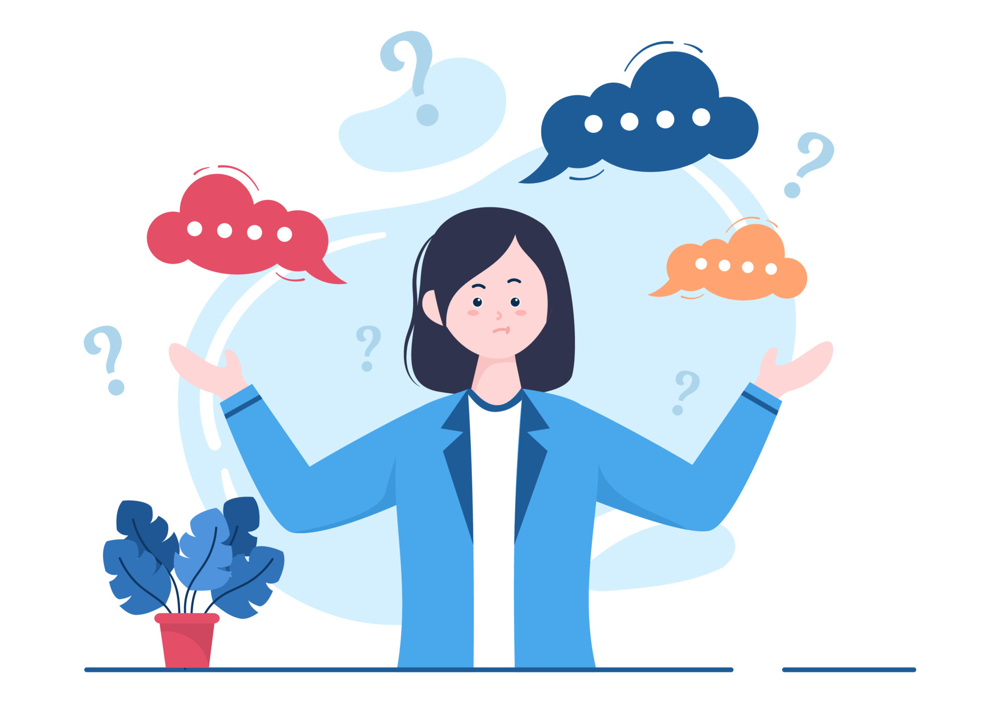

In [44]:
from sklearn import svm
import tensorflow.compat.v1 as tf
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from tensorflow import keras as K
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, concatenate, Input, LSTM, Bidirectional, BatchNormalization, PReLU, ReLU,Reshape
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import cross_val_score
from tensorflow import keras
import joblib

2024-09-15 11:02:19.455477: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-15 11:02:26.037627: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2024-09-15 11:02:26.038984: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/loca

In [45]:
X = classification_df[['Delta','Theta','Alpha1','Alpha2','Beta1','Beta2','Gamma1','Gamma2']]
y = classification_df['label']

In [46]:
print(y.unique())

['work' 'go have fun or do something challenging' 'sleep' 'relax'
 'unknown']


In [47]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [48]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
y_onehot = to_categorical(y_encoded, num_classes=5)
y_test_onehot = to_categorical(y_test_encoded,num_classes=5)

In [49]:
print(y_onehot.shape)
print(X_train.shape)
print(y_test_onehot.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(14959, 5)
(14959, 8)
(3740, 5)
(3740, 8)
(14959,)
(3740,)


In [37]:
# model = Sequential()
# model.add(Dense(128, input_dim=X_train.shape[1],activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(64,activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(4,activation='softmax'))

In [38]:
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [39]:
# history = model.fit(X_train, y_onehot, epochs=100, batch_size=32, validation_data=(X_test, y_test_onehot))


In [40]:
# import matplotlib.pyplot as plt


# # Extract training and validation loss and accuracy from the History object
# epochs = range(1, len(history.history['loss']) + 1)
# train_loss = history.history['loss']
# val_loss = history.history['val_loss']
# train_accuracy = history.history['accuracy']
# val_accuracy = history.history['val_accuracy']

# # Plot training and validation loss
# plt.figure(figsize=(12, 5))
# # 
# plt.subplot(1, 2, 1)
# plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
# plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
# plt.title('Training and Validation Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()

# # Plot training and validation accuracy
# plt.subplot(1, 2, 2)
# plt.plot(epochs, train_accuracy, 'bo-', label='Training Accuracy')
# plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
# plt.title('Training and Validation Accuracy')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.legend()

# plt.tight_layout()
# plt.show()

In [43]:
# np.set_printoptions(threshold=np.inf)
# prediction = model.predict(X_test)
# predicted_labels = label_encoder.inverse_transform(np.argmax(prediction, axis=1))
# print(predicted_labels)

In [50]:
#X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
task_classification_svm_model = SVC(kernel='rbf', gamma='scale', C=1.0, probability=True)
task_classification_svm_model.fit(X_train, y_encoded)
y_pred = task_classification_svm_model.predict(X_test)
print('Accuracy:', accuracy_score(y_test_encoded, y_pred))
print('\nClassification Report:\n', classification_report(y_test_encoded, y_pred))

Accuracy: 0.7598930481283422

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.38      0.48       561
           1       0.00      0.00      0.00       126
           2       0.83      0.12      0.21       331
           3       0.00      0.00      0.00       131
           4       0.77      1.00      0.87      2591

    accuracy                           0.76      3740
   macro avg       0.45      0.30      0.31      3740
weighted avg       0.71      0.76      0.69      3740



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [51]:
joblib.dump(task_classification_svm_model, 'task_classification_svm_model.pkl')

['task_classification_svm_model.pkl']

In [52]:
np.set_printoptions(threshold=np.inf)
prediction = task_classification_svm_model.predict_proba(X_test)
predicted_labels = np.argmax(prediction, axis=1)
prdicted_labels = label_encoder.inverse_transform(predicted_labels)
print(predicted_labels)

[4 1 4 4 4 4 4 4 0 4 4 4 4 1 4 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 4 4
 4 1 4 1 4 0 4 4 4 4 4 4 4 4 4 0 4 4 2 4 1 4 4 4 0 4 4 4 4 1 4 4 4 4 4 4 4
 4 4 4 4 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 1 4
 4 4 4 4 4 4 4 1 4 0 4 4 4 4 4 1 4 4 2 0 0 4 4 0 0 4 1 4 4 4 1 4 4 1 4 4 4
 4 4 4 4 4 4 4 0 4 4 4 0 0 1 4 4 4 0 4 4 4 4 4 4 4 2 0 4 1 0 1 0 4 4 4 0 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 1 4 0 4 4 1 2 0 4 4 4 4 0 4
 4 4 1 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 1 4 4 4 4 2 1 1 4 4 4 4 4 1 4 4 4 4
 1 4 4 4 4 1 4 4 4 4 4 4 0 1 2 0 1 4 4 4 4 4 1 4 4 4 0 4 4 4 4 4 4 4 4 4 4
 0 4 4 4 4 4 1 4 2 1 0 4 4 4 4 4 4 1 4 4 4 4 1 4 4 4 4 4 4 2 0 4 4 4 4 4 4
 4 4 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 4
 4 4 1 0 4 1 4 4 4 4 4 0 4 4 0 0 4 4 4 4 4 4 4 1 4 4 4 4 4 4 0 4 1 4 4 4 2
 4 0 4 4 4 4 4 1 4 4 4 4 4 4 4 4 0 2 0 4 0 1 4 4 4 1 4 4 4 4 4 4 4 4 4 4 4
 4 4 1 4 4 0 4 4 4 0 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 2 4 1 1 1 4 4 1 4 4 4 4
 2 4 0 4 4 4 4 4 4 4 4 4 

In [53]:
print('original labels', label_encoder.classes_)
print("Unique predictions:", np.unique(predicted_labels))

original labels ['go have fun or do something challenging' 'relax' 'sleep' 'unknown'
 'work']
Unique predictions: [0 1 2 4]


# Performance Tracking

Now that we have discovered the tasks we should undertake we don't want to stop our fun there. We can track our frequency waves as we are doing our task to know how well we are doing, but also maybe when we should stop. Take for instance our studying performance metric, we will be able to see what times you are confused and challenged by a problem and when you have mastered it! No more wasting time studying for hours on end. Outside of this metric we want to track your sleep cycles when you do sleep and see if you are in your Rem or NRem stage. When working we will see if you are maintaining focus or when your mind begins to wander too much and you become unfocused. Finally, when your either relaxing, enjoying yourself, or doing something challenging we will be able to track how content, happy, or upset you are as you are doing these task.

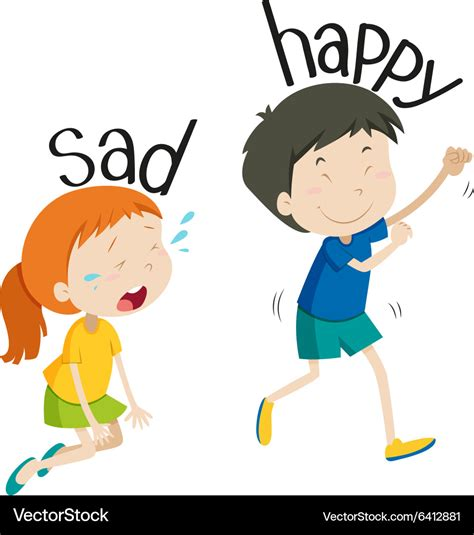

# Studying Performance Metric

Confused / mastered

In [54]:
confused_data.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,3.019630000e+05,9.061200000e+04,3.373500000e+04,2.399100000e+04,2.794600000e+04,4.509700000e+04,3.322800000e+04,8.293000000e+03,confused
1,7.378700000e+04,2.808300000e+04,1.439000000e+03,2.240000000e+03,2.746000000e+03,3.687000000e+03,5.293000000e+03,2.740000000e+03,confused
2,7.583530000e+05,3.837450000e+05,2.019990000e+05,6.210700000e+04,3.629300000e+04,1.305360000e+05,5.724300000e+04,2.535400000e+04,confused
3,2.012240000e+06,1.293500000e+05,6.123600000e+04,1.708400000e+04,1.148800000e+04,6.246200000e+04,4.996000000e+04,3.393200000e+04,confused
4,1.005145000e+06,3.543280000e+05,3.710200000e+04,8.888100000e+04,4.530700000e+04,9.960300000e+04,4.479000000e+04,2.974900000e+04,confused


In [55]:
y = confused_data['label'].values
x = confused_data[['Delta','Theta', 'Alpha1','Alpha2','Beta1','Beta2','Gamma1','Gamma2']]


In [56]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [57]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_train)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)



In [58]:
x_train.shape, x_test.shape, y_encoded.shape, y_test.shape

((10248, 8), (2563, 8), (10248,), (2563,))

In [59]:
studying_performance_svm_model = SVC(kernel='rbf',gamma='scale')
studying_performance_svm_model.fit(x_train, y_train)

SVC()

In [60]:
y_pred = studying_performance_svm_model.predict(x_test)

In [61]:
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print('Accuracy:', accuracy)
print('\nClassification Report\n', classification_rep)

Accuracy: 0.6016387046429965

Classification Report
               precision    recall  f1-score   support

    confused       0.60      0.64      0.62      1298
  understood       0.60      0.56      0.58      1265

    accuracy                           0.60      2563
   macro avg       0.60      0.60      0.60      2563
weighted avg       0.60      0.60      0.60      2563



In [62]:
joblib.dump(studying_performance_svm_model, 'studying_performance_svm_model.pkl')

['studying_performance_svm_model.pkl']

# Work Performance Metric

In [63]:
mental_state_df.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,4.650131731e+02,2.110343882e+01,6.847064824e+00,4.686441618e+00,7.231601853e+00,4.988677576e+00,4.176202042e+00,1.273845522e+00,focus
1,2.488300397e+03,1.953393823e+02,3.749059739e+01,1.562364682e+01,2.890770439e+01,1.755509223e+01,1.048087542e+01,2.906634722e+00,focus
2,3.725022197e+03,1.051135240e+02,1.353268889e+01,8.960385777e+00,1.579843552e+01,8.720260590e+00,7.986785418e+00,5.439567642e+00,focus
3,1.533698669e+03,5.694317729e+01,1.240352547e+01,7.909669604e+00,1.279190346e+01,7.499974692e+00,4.845032440e+00,8.384289933e-01,focus
4,5.462177068e+02,3.833340178e+01,1.078594174e+01,7.245459803e+00,1.029302351e+01,6.037992272e+00,4.239628674e+00,6.390810714e-01,focus


In [64]:
def relabel(label):
    if 'focus' in label:
        return 'focus'
    if 'drowsy' in label:
        return 'unfocus'
    
mental_state_df['label'] = mental_state_df['label'].apply(relabel)
print(mental_state_df['label'].unique())

['focus' 'unfocus']


In [65]:
mental_state_df['label']

0      focus
1      focus
2      focus
3      focus
4      focus
5      focus
6      focus
0      focus
1      focus
2      focus
3      focus
4      focus
5      focus
6      focus
0    unfocus
1    unfocus
2    unfocus
3    unfocus
4    unfocus
5    unfocus
6    unfocus
Name: label, dtype: object

In [66]:
y = mental_state_df['label'].values
x = mental_state_df[['Delta','Theta', 'Alpha1','Alpha2','Beta1','Beta2','Gamma1','Gamma2']]


In [67]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [68]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)


In [69]:

x_train.shape, x_test.shape, y_train.shape,y_test.shape

((16, 8), (5, 8), (16,), (5,))

In [70]:
y_train.dtype

dtype('int64')

In [71]:
focus_svm_model = SVC(kernel='linear',probability=True, class_weight='balanced',C=0.001)
focus_svm_model.fit(x_train, y_train)
y_pred = focus_svm_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print('Accuracy:', accuracy)
print('\nClassification Report\n', classification_rep)

Accuracy: 0.6

Classification Report
               precision    recall  f1-score   support

       focus       0.67      0.67      0.67         3
     unfocus       0.50      0.50      0.50         2

    accuracy                           0.60         5
   macro avg       0.58      0.58      0.58         5
weighted avg       0.60      0.60      0.60         5



In [195]:
# class_weights = {0:1,1:5}
# focus_svm_model = SVC(kernel='rbf',gamma='scale',probability=True, class_weight='balanced',C=0.001)
# focus_svm_model.fit(x_train, y_train)
# y_pred = focus_svm_model.predict(x_test)
# accuracy = accuracy_score(y_test, y_pred)
# classification_rep = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
# print('Accuracy:', accuracy)
# print('\nClassification Report\n', classification_rep)

Accuracy: 0.6

Classification Report
               precision    recall  f1-score   support

       focus       0.60      1.00      0.75         3
     unfocus       0.00      0.00      0.00         2

    accuracy                           0.60         5
   macro avg       0.30      0.50      0.37         5
weighted avg       0.36      0.60      0.45         5



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [72]:
joblib.dump(focus_svm_model, 'focus_svm_model.pkl')

['focus_svm_model.pkl']

In [73]:
np.set_printoptions(threshold=np.inf)
prediction = focus_svm_model.predict_proba(X_test)
predicted_labels = np.argmax(prediction, axis=1)
prdicted_labels = label_encoder.inverse_transform(predicted_labels)
print(predicted_labels)

[1 1 1 0 0 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1 1
 0 1 0 1 1 0 1 1 0 0 0 1 0 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 1 1 1
 1 1 0 1 1 1 0 1 1 1 1 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1
 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 0 1 1 1 1 0 1 1 1 0 1 0 1 1
 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0
 1 0 1 0 1 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0 1 0 1 1 0 0 1 1 1 1 0 0 0 0 0 1 1
 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 1 1 0 1 1 1 0 1
 1 1 0 0 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 0 1 0 1 1 1 0 1 0 0
 0 0 0 0 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 1 1 0 1 0 0 0 0
 1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 1 1 0 1 0 0 0 1 1 0 1 1 1 1 1 0 1 1 1 0 0 1
 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 1 1 0 1 1 0
 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 1
 1 0 1 1 1 1 1 1 1 0 1 0 

In [169]:
# from sklearn.utils.class_weight import compute_class_weight

# class_weights = compute_class_weight('balanced', classes=np.unique(y_train),y=y_train)
# class_weight_dict = dict(enumerate(class_weights))


# model = Sequential()
# model.add(Dense(128, input_dim=x_train.shape[1],activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(64,activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(1,activation='sigmoid'))
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# history = model.fit(x_train, y_train, epochs=100, batch_size=32, validation_data=(x_test, y_test), class_weight = class_weight_dict)


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.4375 - loss: 52.0823 - val_accuracy: 0.2000 - val_loss: 7.4347
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.5000 - loss: 29.3766 - val_accuracy: 0.2000 - val_loss: 3.4413
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.5625 - loss: 8.9140 - val_accuracy: 0.4000 - val_loss: 1.6589
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5000 - loss: 21.4854 - val_accuracy: 0.6000 - val_loss: 1.6228
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.5000 - loss: 16.6942 - val_accuracy: 0.6000 - val_loss: 1.7740
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.3750 - loss: 25.0419 - val_accuracy: 0.6000 - val_loss: 1.9553
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.4375 - loss: 17.4161 - val_accuracy: 0.6000 - val_loss: 1.9063
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.3125 - loss: 32.1852 - val_accuracy: 0.6000 - val_loss: 2.2649

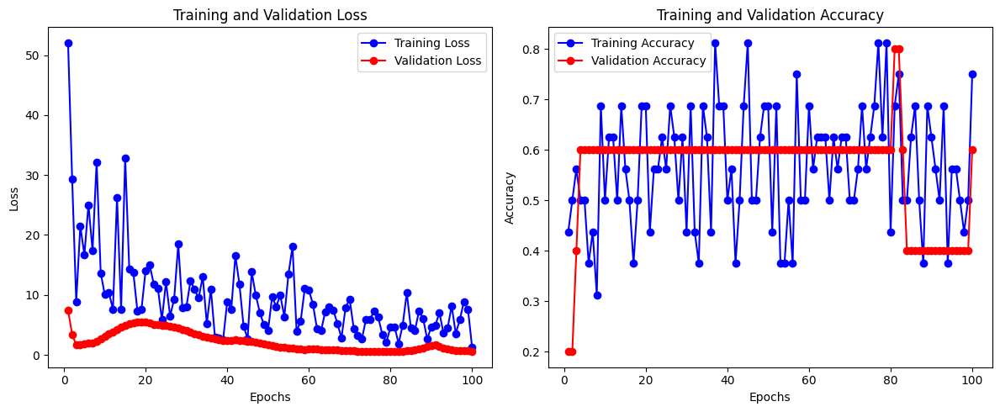

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
['focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus' 'focus'
 'focus' '

In [170]:
# import matplotlib.pyplot as plt


# # # Extract training and validation loss and accuracy from the History object
# epochs = range(1, len(history.history['loss']) + 1)
# train_loss = history.history['loss']
# val_loss = history.history['val_loss']
# train_accuracy = history.history['accuracy']
# val_accuracy = history.history['val_accuracy']
# # # Plot training and validation loss
# plt.figure(figsize=(12, 5))
# # # 
# plt.subplot(1, 2, 1)
# plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
# plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
# plt.title('Training and Validation Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()

# # # Plot training and validation accuracy
# plt.subplot(1, 2, 2)
# plt.plot(epochs, train_accuracy, 'bo-', label='Training Accuracy')
# plt.plot(epochs, val_accuracy, 'ro-', label='Validation Accuracy')
# plt.title('Training and Validation Accuracy')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.legend()

# plt.tight_layout()
# plt.show()

# np.set_printoptions(threshold=np.inf)
# prediction = model.predict(X_test)
# predicted_labels = label_encoder.inverse_transform(np.argmax(prediction, axis=1))
# print(predicted_labels)

# Emotion Performance Metric

In [74]:
emotion_band_power_df.head()

,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,label
0,-1.00e+01,1.05e+03,1.80e+02,6.20e+02,-1.14e+02,2.44e+02,1.04e+03,7.09e+02,NEGATIVE
1,9.37e+01,1.97e+02,-5.13e+01,-3.46e+00,3.73e+02,3.39e+02,4.52e+02,2.69e+02,NEUTRAL
2,2.86e+02,2.79e+02,1.10e+03,8.12e+02,1.37e+03,2.07e+03,1.61e+03,1.93e+03,POSITIVE
3,5.61e+01,-2.98e+02,5.57e+02,-3.51e+01,2.06e+02,1.18e+03,9.48e+01,2.83e+02,POSITIVE
4,2.86e+02,5.44e+02,-1.03e+01,-2.94e+01,7.55e+02,8.62e+02,8.86e+02,5.26e+02,NEUTRAL


In [75]:
y = emotion_band_power_df['label'].values
x = emotion_band_power_df[['Delta','Theta', 'Alpha1','Alpha2','Beta1','Beta2','Gamma1','Gamma2']]


In [76]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [77]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_train)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)


In [78]:
emotion_state_svm_model = SVC(kernel='rbf',gamma='scale')
emotion_state_svm_model.fit(x_train, y_train)
y_pred = emotion_state_svm_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print('Accuracy:', accuracy)
print('\nClassification Report\n', classification_rep)

Accuracy: 0.927400468384075

Classification Report
               precision    recall  f1-score   support

    NEGATIVE       0.92      0.96      0.94       143
     NEUTRAL       0.97      0.95      0.96       148
    POSITIVE       0.89      0.88      0.88       136

    accuracy                           0.93       427
   macro avg       0.93      0.93      0.93       427
weighted avg       0.93      0.93      0.93       427



In [79]:
joblib.dump(emotion_state_svm_model, 'emotion_state_svm_model.pkl')

['emotion_state_svm_model.pkl']

# Sleep Quality Performance Metric

In [88]:
sq_df = pd.read_csv('/home/jupyter/imported/kaggle/input/rem-and-nrem-sleep-classification/REM_NREM.csv')
sq_df.head()

,Sleep_Stage,MeanP_Alpha_F4,MedianF_Alpha_F4,MeanF_Alpha_F4,Spectral Edge_Alpha_F4,PeakF_Alpha_F4,MeanP_Beta_F4,MedianF_Beta_F4,MeanF_Beta_F4,Spectral Edge_Beta_F4,...,MeanP_Delta_O2,MedianF_Delta_O2,MeanF_Delta_O2,Spectral Edge_Delta_O2,PeakF_Delta_O2,MeanP_Gamma_O2,MedianF_Gamma_O2,MeanF_Gamma_O2,Spectral Edge_Gamma_O2,PeakF_Gamma_O2
0,NREM,3.400000000e-04,1.011512000e+01,1.785756000e+01,1.748293000e+01,1.024000000e+01,4.700000000e-04,1.773268000e+01,2.535024000e+01,2.747317000e+01,...,1.120000000e-03,7.492700000e-01,6.368780000e+00,2.872200000e+00,6.243900000e-01,7.610000000e-05,3.271805000e+01,4.383220000e+01,4.995122000e+01,4.995122000e+01
1,NREM,3.500000000e-04,1.073951000e+01,1.760780000e+01,1.710829000e+01,9.116100000e+00,4.800000000e-04,1.685854000e+01,2.522537000e+01,2.697366000e+01,...,7.000000000e-04,9.990200000e-01,6.868290000e+00,3.621460000e+00,7.492700000e-01,7.220000000e-05,3.209366000e+01,4.433171000e+01,4.995122000e+01,4.995122000e+01
2,NREM,3.500000000e-04,9.365850000e+00,1.760780000e+01,1.698341000e+01,9.240980000e+00,4.200000000e-04,1.735805000e+01,2.609951000e+01,2.847220000e+01,...,7.700000000e-04,1.498540000e+00,6.493660000e+00,4.120980000e+00,7.492700000e-01,6.930000000e-05,3.309268000e+01,4.395707000e+01,4.995122000e+01,4.995122000e+01
3,NREM,5.000000000e-04,1.036488000e+01,1.660878000e+01,1.585951000e+01,7.992200000e+00,5.300000000e-04,1.548488000e+01,2.410146000e+01,2.572488000e+01,...,1.300000000e-03,1.873170000e+00,6.119020000e+00,3.746340000e+00,3.746300000e-01,7.020000000e-05,3.159415000e+01,4.283317000e+01,4.995122000e+01,4.995122000e+01
4,NREM,7.200000000e-04,9.365850000e+00,1.598439000e+01,1.548488000e+01,7.992200000e+00,6.700000000e-04,1.511024000e+01,2.222829000e+01,2.322732000e+01,...,1.230000000e-03,1.498540000e+00,6.618540000e+00,3.746340000e+00,7.492700000e-01,6.040000000e-05,2.947122000e+01,4.508098000e+01,4.995122000e+01,4.995122000e+01


In [89]:
sq_columns = sq_df.filter(like='Mean').columns
columns_to_print = list(sq_columns) + ['Sleep_Stage']
sq_df = sq_df[columns_to_print]
print(sq_df['MeanP_Alpha_F4'])

0       3.400000000e-04
1       3.500000000e-04
2       3.500000000e-04
3       5.000000000e-04
4       7.200000000e-04
              ...      
89091   5.500000000e-04
89092   5.200000000e-04
89093   3.100000000e-04
89094   4.200000000e-04
89095   4.000000000e-04
Name: MeanP_Alpha_F4, Length: 89096, dtype: float64


In [90]:
sq_df.columns

Index(['MeanP_Alpha_F4', 'MeanF_Alpha_F4', 'MeanP_Beta_F4', 'MeanF_Beta_F4',
       'MeanP_Theta_F4', 'MeanF_Theta_F4', 'MeanP_Delta_F4', 'MeanF_Delta_F4',
       'MeanP_Gamma_F4', 'MeanF_Gamma_F4', 'MeanP_Alpha_C4', 'MeanF_Alpha_C4',
       'MeanP_Beta_C4', 'MeanF_Beta_C4', 'MeanP_Theta_C4', 'MeanF_Theta_C4',
       'MeanP_Delta_C4', 'MeanF_Delta_C4', 'MeanP_Gamma_C4', 'MeanF_Gamma_C4',
       'MeanP_Alpha_O2', 'MeanF_Alpha_O2', 'MeanP_Beta_O2', 'MeanF_Beta_O2',
       'MeanP_Theta_O2', 'MeanF_Theta_O2', 'MeanP_Delta_O2', 'MeanF_Delta_O2',
       'MeanP_Gamma_O2', 'MeanF_Gamma_O2', 'Sleep_Stage'],
      dtype='object')

In [91]:
frequency_bands = {
    'Delta': (0.5,4),
    'Theta': (4,8),
    'Alpha1': (8.5,10),
    'Alpha2':(10.5,12),
    'Beta1': (13,20),
    'Beta2': (20.5,30),
    'Gamma1': (30.5,40),
    'Gamma2':(40.5,50)
}


column_mapping = {
    'Delta': ['MeanP_Delta_F4', 'MeanF_Delta_F4','MeanP_Delta_C4','MeanF_Delta_C4','MeanP_Delta_O2','MeanF_Delta_O2'],
    'Theta':['MeanP_Theta_F4','MeanF_Theta_F4','MeanP_Theta_C4','MeanF_Theta_C4','MeanP_Theta_O2','MeanF_Theta_O2'],
    'Alpha':['MeanP_Alpha_F4','MeanF_Alpha_F4','MeanP_Alpha_C4','MeanF_Alpha_C4','MeanP_Alpha_O2','MeanF_Alpha_O2'],
#     'Alpha2':['MeanP_Alpha_F4','MeanF_Alpha_F4','MeanP_Alpha_C4','MeanF_Alpha_C4','MeanP_Alpha_O2','MeanF_Alpha_O2'],
    'Beta':['MeanP_Beta_F4','MeanF_Beta_F4','MeanP_Beta_C4','MeanF_Beta_C4','MeanP_Beta_O2','MeanF_Beta_O2'],
#     'Beta2':['MeanP_Beta_F4','MeanF_Beta_F4','MeanP_Beta_C4','MeanF_Beta_C4','MeanP_Beta_O2','MeanF_Beta_O2'],
    'Gamma':['MeanP_Gamma_F4','MeanF_Gamma_F4','MeanP_Gamma_C4','MeanF_Gamma_C4','MeanP_Gamma_O2','MeanF_Gamma_O2'],
#     'Gamma2':['MeanP_Gamma_F4','MeanF_Gamma_F4','MeanP_Gamma_C4','MeanF_Gamma_C4','MeanP_Gamma_O2','MeanF_Gamma_O2']
    
}


def aggregate_bands(sq_df, column_mapping):
    aggregated_data = {}
    for band, columns in column_mapping.items():
        aggregated_data[band] = sq_df[columns].mean(axis=1)
        
    return aggregated_data


band_aggregates = aggregate_bands(sq_df, column_mapping)

sleep_cycle_df = pd.DataFrame(band_aggregates)
sleep_cycle_df['label'] = sq_df['Sleep_Stage']
sleep_cycle_df.head()

,Delta,Theta,Alpha,Beta,Gamma,label
0,3.289136667e+00,6.285718333e+00,9.137068333e+00,1.284185167e+01,2.152069768e+01,NREM
1,3.351448333e+00,6.514668333e+00,9.220326667e+00,1.288349333e+01,2.116687600e+01,NREM
2,3.247441667e+00,5.640600000e+00,8.720821667e+00,1.315402167e+01,2.174963323e+01,NREM
3,2.894623333e+00,5.869705000e+00,8.554385000e+00,1.246725667e+01,2.137500038e+01,NREM
4,2.916285000e+00,5.682781667e+00,8.075826667e+00,1.159318833e+01,2.147906495e+01,NREM


In [92]:
y = sleep_cycle_df['label'].values
x = sleep_cycle_df[['Delta','Theta', 'Alpha','Beta','Gamma']]


In [93]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [94]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_train)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)


In [95]:
svm_model = SVC(kernel='rbf',gamma='scale')
svm_model.fit(x_train, y_train)
y_pred = svm_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print('Accuracy:', accuracy)
print('\nClassification Report\n', classification_rep)

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 0.8224466891133558

Classification Report
               precision    recall  f1-score   support

        NREM       0.82      1.00      0.90     14656
         REM       0.00      0.00      0.00      3164

    accuracy                           0.82     17820
   macro avg       0.41      0.50      0.45     17820
weighted avg       0.68      0.82      0.74     17820



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [96]:
joblib.dump(svm_model, 'svm_model.pkl')

['svm_model.pkl']

# Future Considerations

Hopefully in the future I will be able to turn this idea into a tangible product like an app that you can use with different eeg devices. As you can see we started connecting and deploying it to the Google Cloud Platform in an attempt to deploy what we had. In addition as mentioned earlier improving our data quality and models would make this useful in real world scenarios and hopefully help someone take control of their life in the future. 

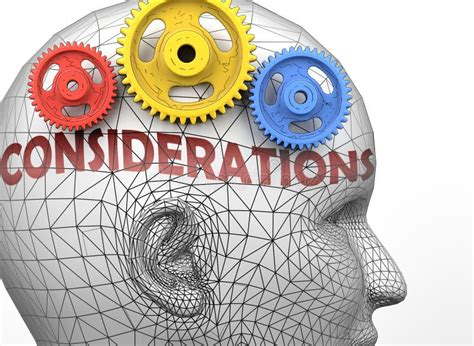

In [ ]:
#!pip install flask
from flask import Flask, request, jsonify
import joblib

# Initialize the Flask app
app = Flask(__name__)

# Load your model
sleep_model = joblib.load('svm_model.pkl')
emotion_model = joblib.load('emotion_state_svm_model.pkl')
focus_model = joblib.load('focus_svm_model.pkl')
study_model=joblib.load('studying_performance_svm_model.pkl')
task_model = joblib.load('task_classification_svm_model.pkl')


# Define a route for predictions
@app.route('/predict', methods=['POST'])
def predict():
    data = request.json
    prediction = model.predict([data['features']])
    return jsonify({'prediction': prediction.tolist()})

# Start the Flask app
if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:5000
 * Running on http://10.128.0.4:5000
Press CTRL+C to quit


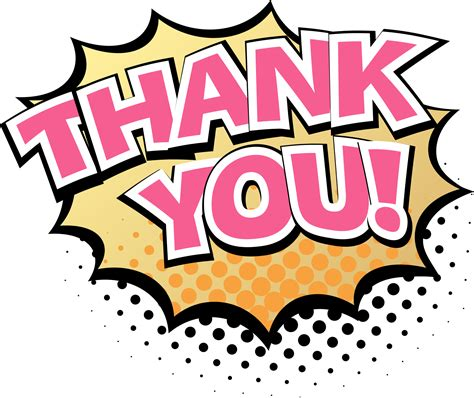

# Thank you HOP Hacks, Johns Hopkins, and all of the Sponsors for a great event!